In [14]:
import numpy as np
import matplotlib.pyplot as plt
import os
from google.colab import drive
import cv2
from IPython.display import display
import pandas as pd
from tqdm.notebook import tqdm

# Mount Google Drive to access your files
drive.mount('/content/drive')

# Set working directory - adjust this path to match your folder location
working_dir = '/content/drive/MyDrive'  # Change this if needed
os.chdir(working_dir)
print(f"Working directory set to: {os.getcwd()}")
print(f"Files in directory: {os.listdir()[:10]}...") # Show first 10 files

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Working directory set to: /content/drive/MyDrive
Files in directory: ['.ipynb_checkpoints', 'Colab Notebooks', 'Igem', 'Papers diplomatikh', 'dataset', 'D_trained.npy', 'MSE_vec.npy', 'MSE_plot.png', 'dictionary_evolution.png', 'recon_woman.jpg.png']...


In [15]:
def GenOMP(D, y, T0, err):
    """
    Generalized Orthogonal Matching Pursuit algorithm

    Parameters:
    -----------
    D : array-like
        Dictionary matrix, shape (n, K)
    y : array-like
        Signal to approximate, shape (n,)
    T0 : int
        Sparsity constraint (max number of non-zero coefficients)
    err : float
        Error tolerance for residual

    Returns:
    --------
    x : array-like
        Sparse representation coefficients, shape (K,)
    """
    K = D.shape[1]  # Number of atoms in dictionary
    x = np.zeros(K)  # Initialize sparse vector

    r = y.copy()  # Initialize residual
    S = []  # Support set

    while np.linalg.norm(r) > err and len(S) < T0:
        # Calculate correlations and find the atom with highest correlation
        correlations = np.abs(D.T @ r)
        k = np.argmax(correlations)

        # Check if this atom is already in the support
        if k in S:
            break

        # Add atom to support
        S.append(k)

        # Solve least squares problem to find coefficients
        DS = D[:, S]
        x_S = np.linalg.pinv(DS) @ y

        # Update sparse representation
        x[S] = x_S

        # Update residual
        r = y - DS @ x_S

    return x

In [16]:
# Load the trained dictionary
try:
    # Try loading .npy file
    D = np.load('D_trained.npy')
    print(f"Dictionary loaded with shape: {D.shape}")
except Exception as e:
    print(f"Error loading D_trained.npy: {e}")
    # If .npy fails, try loading from a potential alternate format
    try:
        print("Looking for any dictionary-related files...")
        dict_files = [f for f in os.listdir() if f.startswith('D_') or 'dict' in f.lower()]
        print(f"Found potential dictionary files: {dict_files}")

        for file in dict_files:
            try:
                if file.endswith('.npy'):
                    D = np.load(file)
                    print(f"Successfully loaded dictionary from {file} with shape {D.shape}")
                    break
            except Exception as e2:
                print(f"Could not load {file}: {e2}")
    except Exception as e3:
        print(f"Error while searching for dictionary files: {e3}")
        print("Please ensure the dictionary file exists in your Google Drive")

Dictionary loaded with shape: (64, 100)


In [17]:
# Helper functions for image processing
def extract_patches(image, patch_size, stride):
    """Extract patches from an image"""
    # Get image dimensions
    H, W = image.shape

    # Calculate number of patches in each dimension
    h_patches = (H - patch_size) // stride + 1
    w_patches = (W - patch_size) // stride + 1

    # Initialize array to store all patches
    patches = np.zeros((h_patches * w_patches, patch_size * patch_size))

    # Extract patches
    patch_idx = 0
    for r in range(0, H - patch_size + 1, stride):
        for c in range(0, W - patch_size + 1, stride):
            patch = image[r:r+patch_size, c:c+patch_size]
            patches[patch_idx] = patch.flatten()
            patch_idx += 1

    return patches, (h_patches, w_patches)

def reconstruct_image(patches, patch_size, image_shape, stride):
    """Reconstruct image from patches"""
    H, W = image_shape
    reconstructed = np.zeros(image_shape)
    counts = np.zeros(image_shape)

    # Calculate patches in each dimension
    h_patches = ((H - patch_size) // stride) + 1
    w_patches = ((W - patch_size) // stride) + 1

    # Reconstruct image
    patch_idx = 0
    for r in range(0, H - patch_size + 1, stride):
        for c in range(0, W - patch_size + 1, stride):
            patch = patches[patch_idx].reshape((patch_size, patch_size))
            reconstructed[r:r+patch_size, c:c+patch_size] += patch
            counts[r:r+patch_size, c:c+patch_size] += 1
            patch_idx += 1

    # Average overlapping patches
    counts[counts == 0] = 1  # Avoid division by zero
    reconstructed /= counts

    return reconstructed

In [18]:
# Find test images in the dataset/test directory

def find_test_images():
    """Find test images in the dataset/test directory"""
    # Look for the dataset directory
    dataset_dir = os.path.join(working_dir, 'dataset')

    if not os.path.exists(dataset_dir):
        print(f"Dataset directory not found at {dataset_dir}")
        # List current directory to help debugging
        print(f"Contents of current directory: {os.listdir(working_dir)[:20]}")
        return [], ""

    # Look for the test subdirectory
    test_dir = os.path.join(dataset_dir, 'test')

    if not os.path.exists(test_dir):
        print(f"Test directory not found at {test_dir}")
        print(f"Contents of dataset directory: {os.listdir(dataset_dir)}")
        return [], ""

    # List all jpg files in the test directory
    test_images = [f for f in os.listdir(test_dir) if f.endswith('.jpg')]

    if not test_images:
        print("No jpg images found in test directory")
        print(f"Contents of test directory: {os.listdir(test_dir)}")
        # Try any image file
        test_images = [f for f in os.listdir(test_dir)
                     if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]

    return test_images, test_dir

# Get test images
test_list, test_dir = find_test_images()
print(f"Found {len(test_list)} test images in dataset/test: {test_list}")

# If no test images found, display an error
if not test_list:
    print("\nERROR: No test images found in dataset/test directory!")
    print("Please check that the dataset folder structure is correct and contains test images.")

Found 7 test images in dataset/test: ['woman.jpg', 'cat_unknown.jpg', 'keanu.jpg', 'floathouse.jpg', 'cat_known.jpg', 'field.jpg', 'parrot.jpg']


In [19]:
# Constants for the experiments
patch_size = 8                # 8×8 patch
T0 = 10                       # sparsity
err = 1e-4                    # ‖r‖₂ threshold in OMP
scale_f = 0.25                # down-sampling factor
stride = patch_size           # non-overlapping patches
SNR_list = [0, 20, 50, 100]   # dB
missing = 0.50                # 50% inpainting mask
np.random.seed(42)            # For reproducibility

In [20]:
def denoise_image(image, D, SNR_target, patch_size, stride, T0, err):
    """
    Denoise an image using dictionary learning

    Parameters:
    -----------
    image : array-like
        Original clean image
    D : array-like
        Dictionary matrix
    SNR_target : float
        Target Signal-to-Noise Ratio in dB
    patch_size : int
        Size of patches (square)
    stride : int
        Stride for patch extraction
    T0 : int
        Sparsity constraint
    err : float
        Error tolerance

    Returns:
    --------
    noisy : array-like
        Noisy image
    denoised : array-like
        Denoised image
    mse : float
        Mean Squared Error between original and denoised
    """
    H, W = image.shape

    # Calculate noise level to achieve target SNR
    P_signal = np.mean(image**2)
    P_noise = P_signal / (10**(SNR_target/10))
    noise = np.sqrt(P_noise) * np.random.randn(*image.shape)

    # Add noise
    noisy = image + noise

    # Initialize denoised image
    denoised = np.zeros((H, W))

    # Process each patch
    for r in range(0, H - patch_size + 1, stride):
        for c in range(0, W - patch_size + 1, stride):
            # Extract patch
            patch = noisy[r:r+patch_size, c:c+patch_size].flatten()

            # Normalize patch
            norm = np.linalg.norm(patch)
            if norm < 1e-8:
                norm = 1

            # Sparse coding
            x = GenOMP(D, patch / norm, T0, err)

            # Reconstruct patch
            patch_rec = (D @ x) * norm
            patch_rec = patch_rec.reshape((patch_size, patch_size))

            # Place reconstructed patch
            denoised[r:r+patch_size, c:c+patch_size] = patch_rec

    # Calculate MSE
    mse = np.mean((image - denoised)**2)

    return noisy, denoised, mse

In [21]:
def inpaint_image(image, D, SNR_target, patch_size, stride, T0, err, missing_ratio):
    """
    Inpaint an image with missing pixels using dictionary learning

    Parameters:
    -----------
    image : array-like
        Original clean image
    D : array-like
        Dictionary matrix
    SNR_target : float
        Target Signal-to-Noise Ratio in dB
    patch_size : int
        Size of patches (square)
    stride : int
        Stride for patch extraction
    T0 : int
        Sparsity constraint
    err : float
        Error tolerance
    missing_ratio : float
        Ratio of pixels to be masked

    Returns:
    --------
    masked : array-like
        Image with missing pixels
    inpainted : array-like
        Inpainted image
    mse : float
        Mean Squared Error between original and inpainted
    """
    H, W = image.shape

    # Calculate noise level to achieve target SNR
    P_signal = np.mean(image**2)
    P_noise = P_signal / (10**(SNR_target/10))
    noise = np.sqrt(P_noise) * np.random.randn(*image.shape)

    # Add noise
    noisy = image + noise

    # Create random mask
    mask = np.random.rand(*image.shape) > missing_ratio

    # Apply mask
    masked = noisy.copy()
    masked[~mask] = 0

    # Initialize inpainted image
    inpainted = np.zeros((H, W))

    # Process each patch
    for r in range(0, H - patch_size + 1, stride):
        for c in range(0, W - patch_size + 1, stride):
            # Extract patch and its mask
            patch = masked[r:r+patch_size, c:c+patch_size].flatten()
            patch_mask = mask[r:r+patch_size, c:c+patch_size].flatten()

            # If patch is completely masked, use zeros
            if np.sum(patch_mask) == 0:
                inpainted[r:r+patch_size, c:c+patch_size] = 0
                continue

            # Get observed values and corresponding dictionary atoms
            y_obs = patch[patch_mask]
            D_obs = D[patch_mask, :]

            # Normalize
            norm = np.linalg.norm(y_obs)
            if norm < 1e-8:
                norm = 1

            # Sparse coding using only observed pixels
            x = GenOMP(D_obs, y_obs / norm, T0, err)

            # Reconstruct full patch
            patch_rec = (D @ x) * norm
            patch_rec = patch_rec.reshape((patch_size, patch_size))

            # Place reconstructed patch
            inpainted[r:r+patch_size, c:c+patch_size] = patch_rec

    # Calculate MSE
    mse = np.mean((image - inpainted)**2)

    return masked, inpainted, mse

In [22]:
# Function to load and preprocess test images
def load_test_images(test_list, test_dir, scale_f=0.25):
    """Load and preprocess test images from the dataset/test directory"""
    images = []

    for img_name in test_list:
        img_path = os.path.join(test_dir, img_name)
        try:
            # Try to read the image
            img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
            if img is None:
                print(f"Warning: Could not read image {img_path}")
                # Try alternate method
                try:
                    from PIL import Image
                    img = np.array(Image.open(img_path).convert('L'))
                    print(f"Successfully loaded {img_name} using PIL")
                except Exception as e2:
                    print(f"Also failed with PIL: {e2}")
                    continue

            # Resize image
            img = cv2.resize(img, (0, 0), fx=scale_f, fy=scale_f)
            # Normalize to [0, 1]
            img = img.astype(np.float64) / 255.0

            images.append({'name': img_name, 'data': img})
            print(f"Successfully loaded {img_name} with shape {img.shape}")
        except Exception as e:
            print(f"Error loading {img_name}: {e}")

    return images

# Load test images from the dataset/test directory
test_images = load_test_images(test_list, test_dir, scale_f)
print(f"Successfully loaded {len(test_images)} test images")

if not test_images:
    print("No test images were successfully loaded. Please check file paths.")
    print(f"Current directory structure: {os.listdir(working_dir)}")
    if os.path.exists(os.path.join(working_dir, 'dataset')):
        print(f"Dataset directory contents: {os.listdir(os.path.join(working_dir, 'dataset'))}")

Successfully loaded woman.jpg with shape (180, 320)
Successfully loaded cat_unknown.jpg with shape (180, 320)
Successfully loaded keanu.jpg with shape (180, 320)
Successfully loaded floathouse.jpg with shape (180, 320)
Successfully loaded cat_known.jpg with shape (270, 480)
Successfully loaded field.jpg with shape (180, 320)
Successfully loaded parrot.jpg with shape (180, 320)
Successfully loaded 7 test images


In [23]:
print("===== DENOISING =====")

# Initialize results
MSE_den = np.zeros((len(test_images), len(SNR_list)))
results_denoising = {}

for img_idx, img_info in enumerate(test_images):
    img_name = img_info['name']
    img_orig = img_info['data']

    print(f"Processing image {img_idx+1}/{len(test_images)}: {img_name}")

    fig, axs = plt.subplots(len(SNR_list), 3, figsize=(15, 5*len(SNR_list)))

    for snr_idx, snr_target in enumerate(SNR_list):
        # Denoise image
        noisy, denoised, mse = denoise_image(img_orig, D, snr_target, patch_size, stride, T0, err)

        # Store MSE
        MSE_den[img_idx, snr_idx] = mse

        # Plot results
        if len(SNR_list) > 1:
            ax = axs[snr_idx]
        else:
            ax = axs

        ax[0].imshow(img_orig, cmap='gray')
        ax[0].set_title(f'Original @ {snr_target}dB')
        ax[0].axis('off')

        ax[1].imshow(noisy, cmap='gray')
        ax[1].set_title('Noisy')
        ax[1].axis('off')

        ax[2].imshow(denoised, cmap='gray')
        ax[2].set_title('Denoised')
        ax[2].axis('off')

    plt.tight_layout()
    plt.suptitle(f'Denoising: {img_name}', fontsize=16)
    plt.subplots_adjust(top=0.9)
    plt.show()

    # Save results for this image
    results_denoising[img_name] = {
        'MSE': MSE_den[img_idx, :],
        'SNR_list': SNR_list
    }

# Display MSE table
df_den = pd.DataFrame(MSE_den,
                     columns=[f'dB_{snr}' for snr in SNR_list],
                     index=[img['name'] for img in test_images])
print("\nMSE Denoising (rows=images / cols=SNR[dB]):")
display(df_den)

Output hidden; open in https://colab.research.google.com to view.

===== INPAINTING =====
Processing image 1/7: woman.jpg


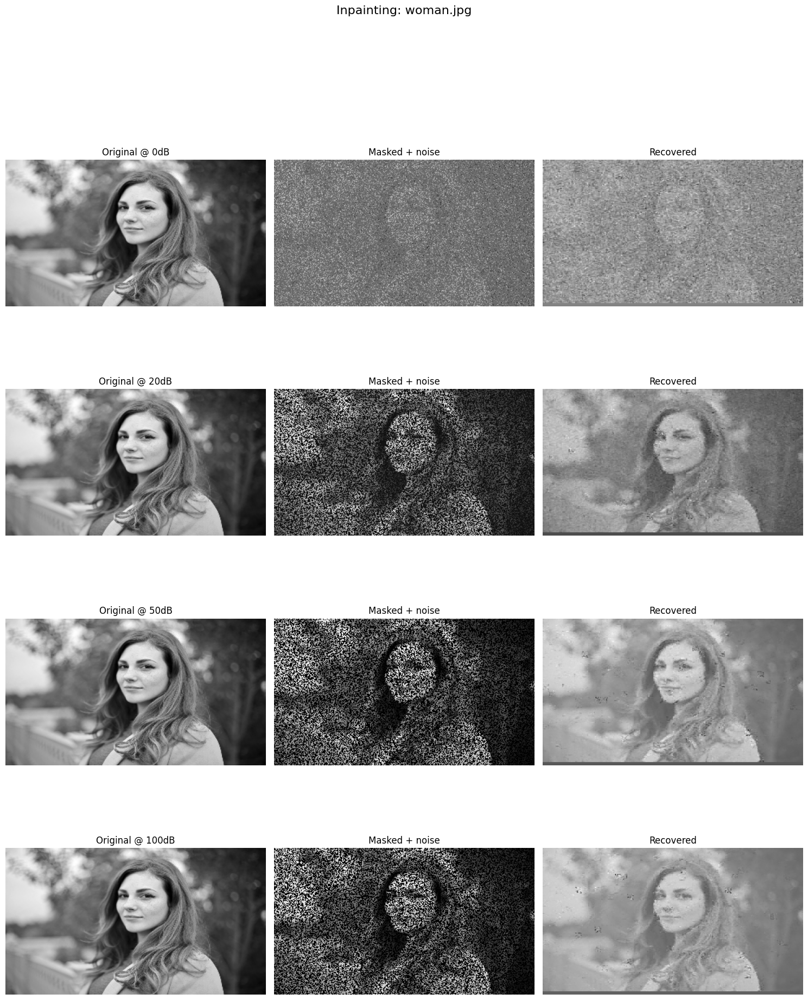

Processing image 2/7: cat_unknown.jpg


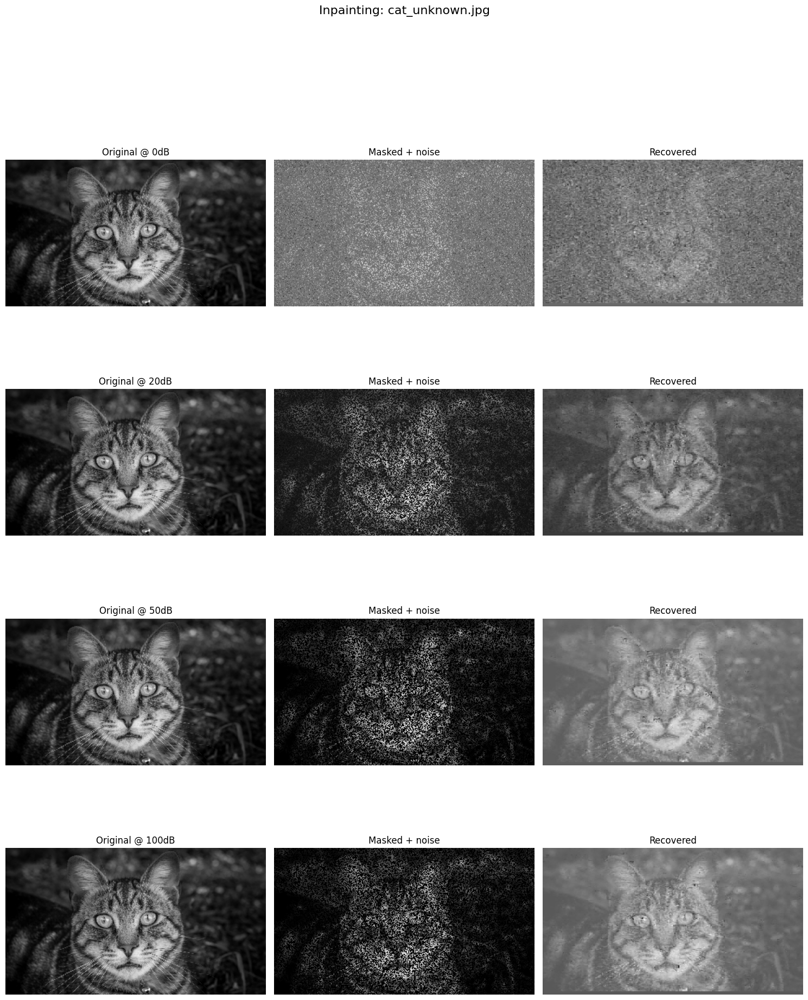

Processing image 3/7: keanu.jpg


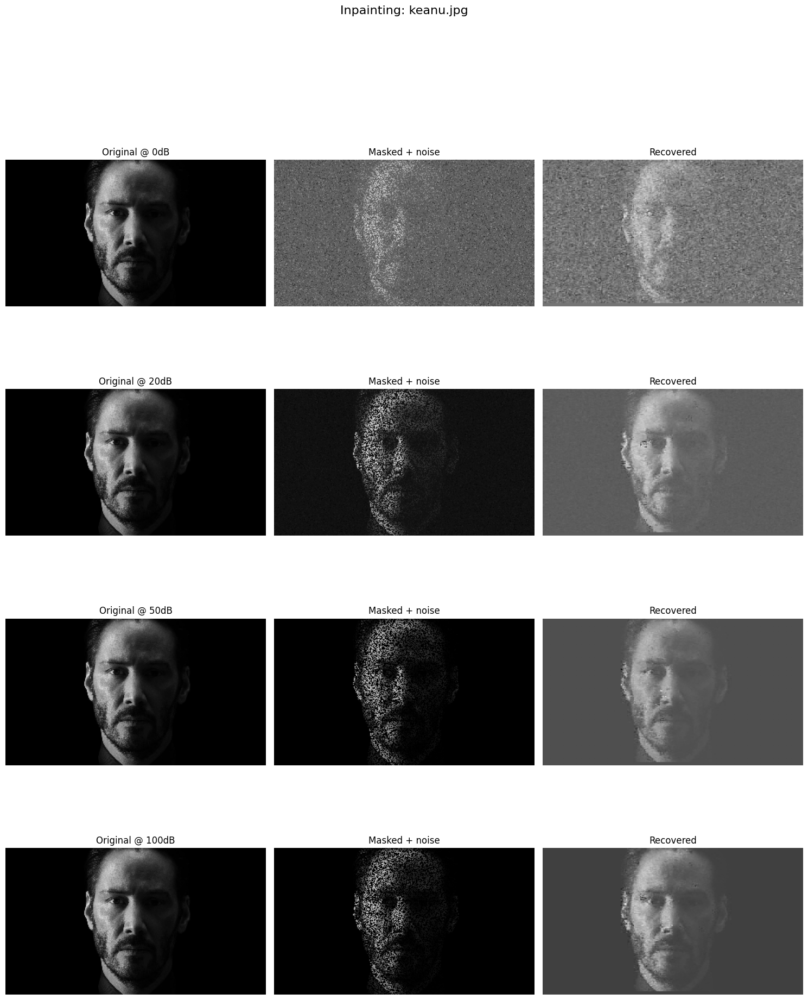

Processing image 4/7: floathouse.jpg


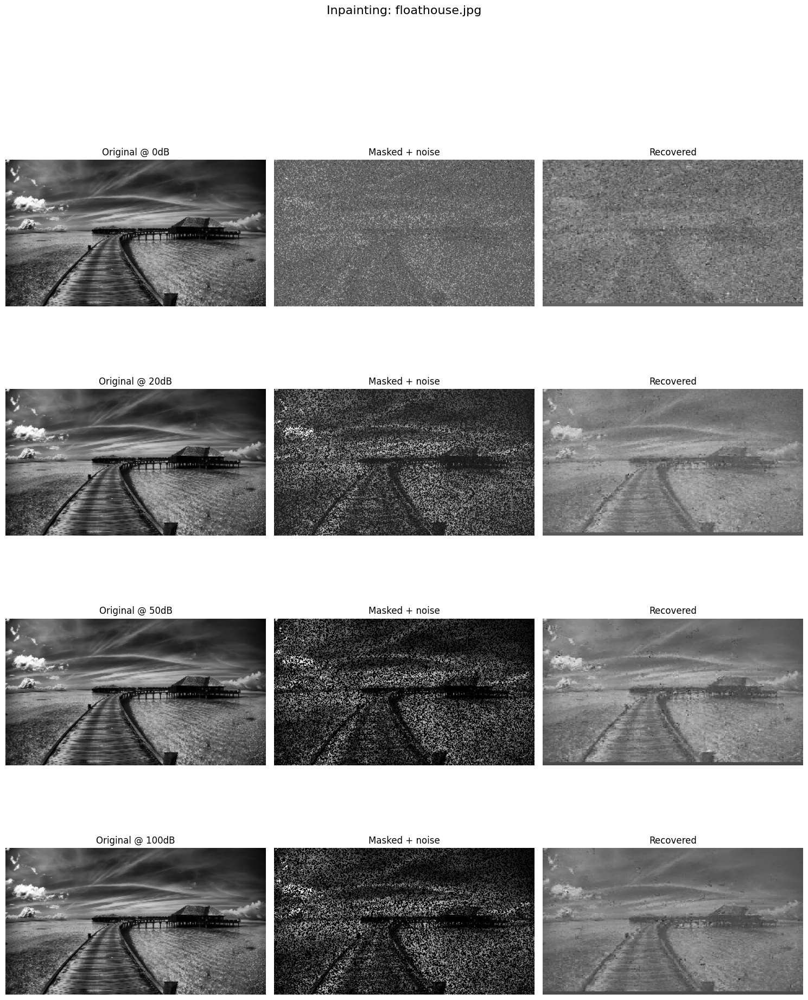

Processing image 5/7: cat_known.jpg


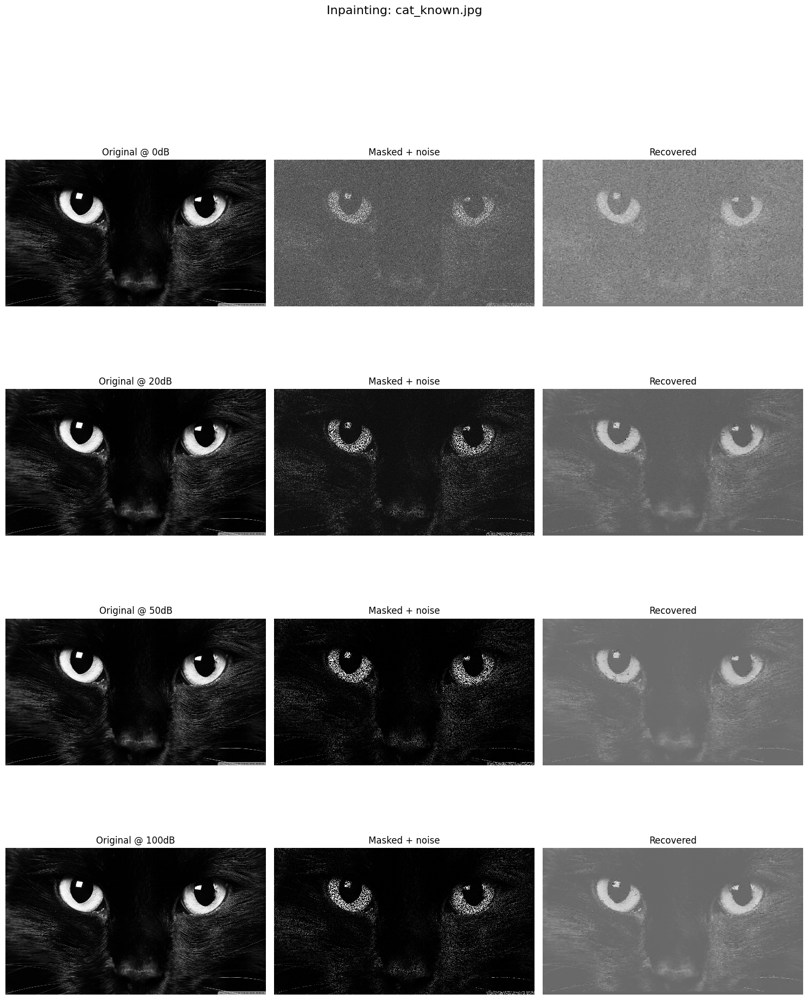

Processing image 6/7: field.jpg


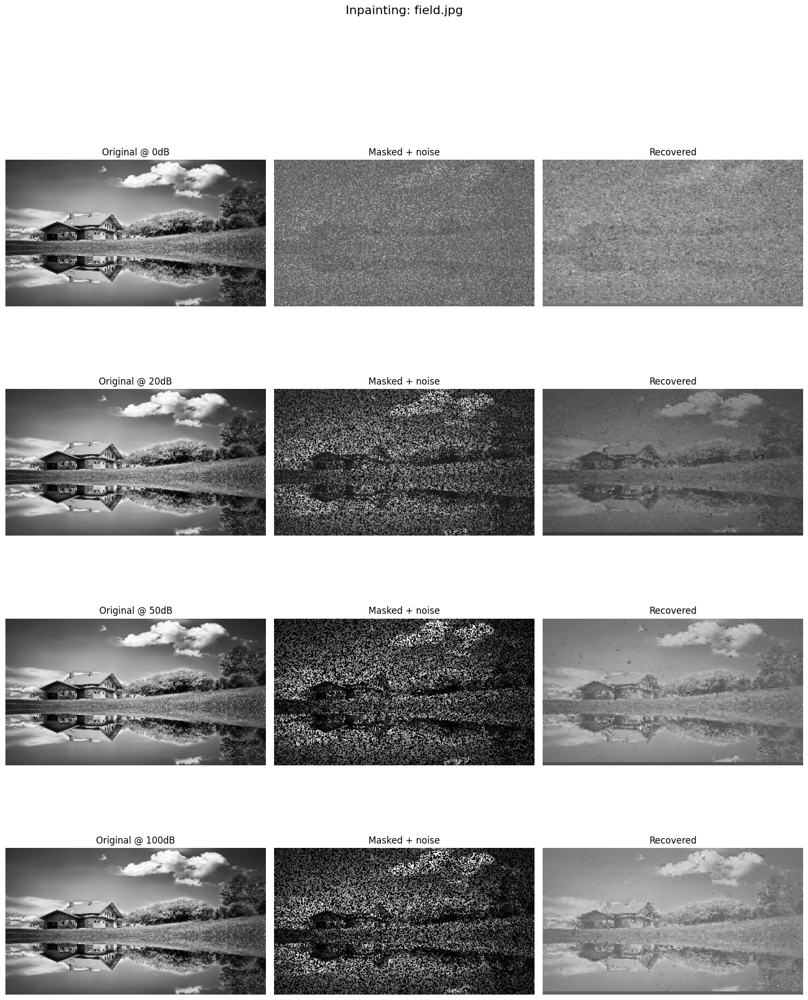

Processing image 7/7: parrot.jpg


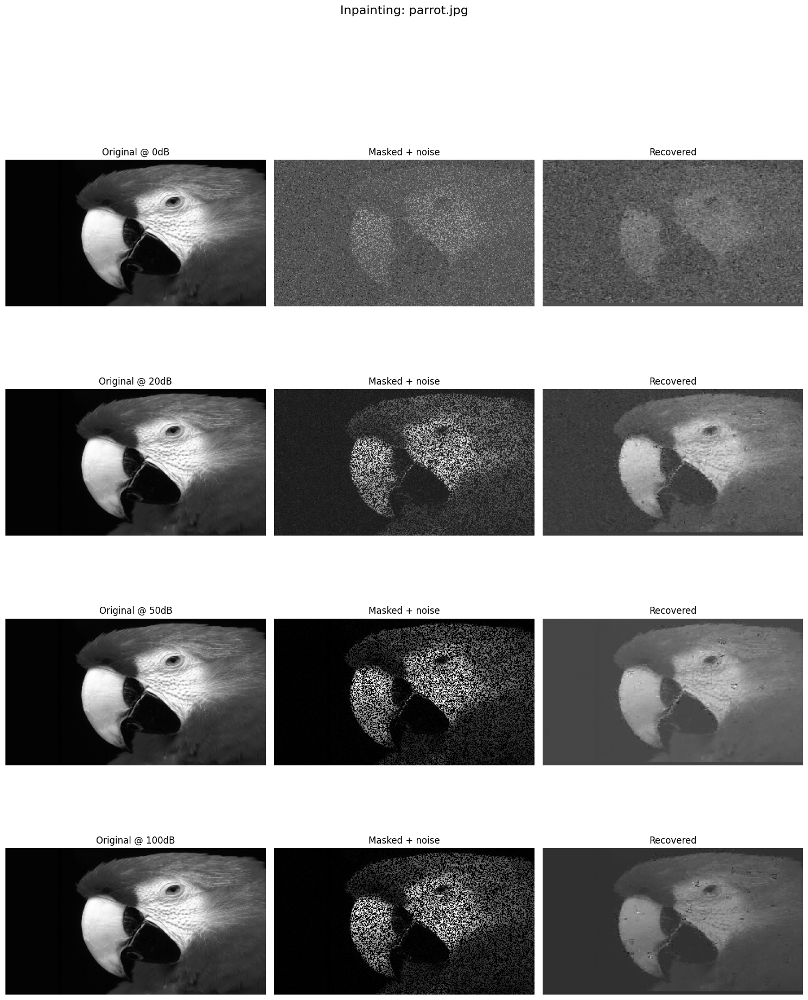


MSE Inpainting (rows=images / cols=SNR[dB]):


,dB_0,dB_20,dB_50,dB_100
woman.jpg,0.228478,0.010312,0.008114,0.008472
cat_unknown.jpg,0.084888,0.005246,0.004532,0.004468
keanu.jpg,0.031127,0.001816,0.001479,0.001420
floathouse.jpg,0.146915,0.009747,0.008157,0.008389
cat_known.jpg,0.032554,0.004053,0.003880,0.003694
field.jpg,0.243973,0.014156,0.011461,0.011318
parrot.jpg,0.126257,0.003668,0.002583,0.002963


In [24]:
print("===== INPAINTING =====")

# Initialize results
MSE_inp = np.zeros((len(test_images), len(SNR_list)))
results_inpainting = {}

for img_idx, img_info in enumerate(test_images):
    img_name = img_info['name']
    img_orig = img_info['data']

    print(f"Processing image {img_idx+1}/{len(test_images)}: {img_name}")

    fig, axs = plt.subplots(len(SNR_list), 3, figsize=(15, 5*len(SNR_list)))

    for snr_idx, snr_target in enumerate(SNR_list):
        # Inpaint image
        masked, inpainted, mse = inpaint_image(img_orig, D, snr_target, patch_size, stride, T0, err, missing)

        # Store MSE
        MSE_inp[img_idx, snr_idx] = mse

        # Plot results
        if len(SNR_list) > 1:
            ax = axs[snr_idx]
        else:
            ax = axs

        ax[0].imshow(img_orig, cmap='gray')
        ax[0].set_title(f'Original @ {snr_target}dB')
        ax[0].axis('off')

        ax[1].imshow(masked, cmap='gray')
        ax[1].set_title('Masked + noise')
        ax[1].axis('off')

        ax[2].imshow(inpainted, cmap='gray')
        ax[2].set_title('Recovered')
        ax[2].axis('off')

    plt.tight_layout()
    plt.suptitle(f'Inpainting: {img_name}', fontsize=16)
    plt.subplots_adjust(top=0.9)
    plt.show()

    # Save results for this image
    results_inpainting[img_name] = {
        'MSE': MSE_inp[img_idx, :],
        'SNR_list': SNR_list
    }

# Display MSE table
df_inp = pd.DataFrame(MSE_inp,
                     columns=[f'dB_{snr}' for snr in SNR_list],
                     index=[img['name'] for img in test_images])
print("\nMSE Inpainting (rows=images / cols=SNR[dB]):")
display(df_inp)

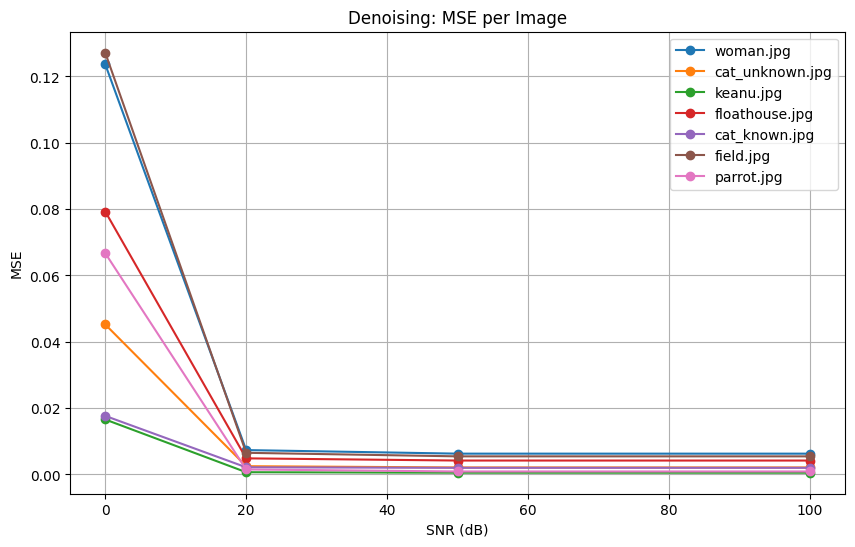

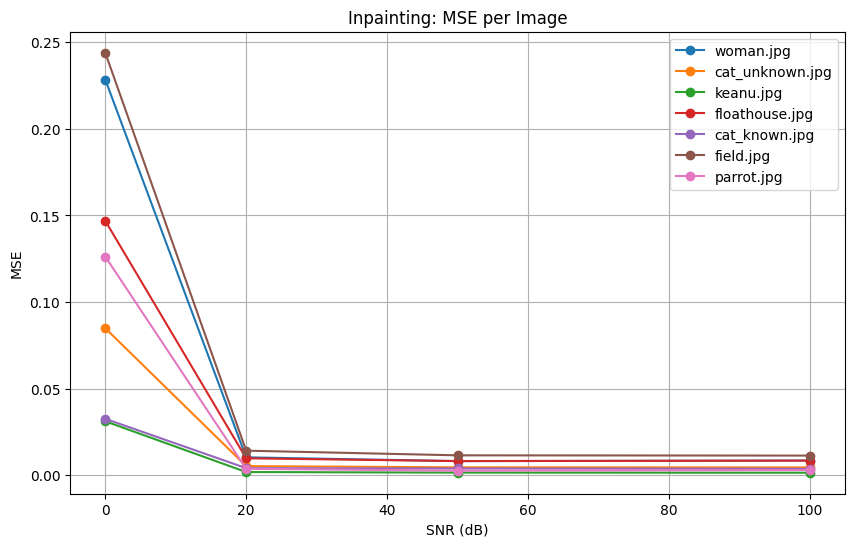

In [25]:
# Plot MSE vs SNR for denoising
plt.figure(figsize=(10, 6))
for img_idx, img_info in enumerate(test_images):
    img_name = img_info['name']
    plt.plot(SNR_list, MSE_den[img_idx, :], '-o', linewidth=1.5, label=img_name)

plt.xlabel('SNR (dB)')
plt.ylabel('MSE')
plt.title('Denoising: MSE per Image')
plt.legend(loc='best')
plt.grid(True)
plt.savefig('MSE_denoising.png', dpi=300, bbox_inches='tight')
plt.show()

# Plot MSE vs SNR for inpainting
plt.figure(figsize=(10, 6))
for img_idx, img_info in enumerate(test_images):
    img_name = img_info['name']
    plt.plot(SNR_list, MSE_inp[img_idx, :], '-o', linewidth=1.5, label=img_name)

plt.xlabel('SNR (dB)')
plt.ylabel('MSE')
plt.title('Inpainting: MSE per Image')
plt.legend(loc='best')
plt.grid(True)
plt.savefig('MSE_inpainting.png', dpi=300, bbox_inches='tight')
plt.show()